<a href="https://colab.research.google.com/github/bharath-07/Video-Steganography/blob/master/test1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import cv2
import numpy as np
from scipy.spatial import distance as dis
from google.colab.patches import cv2_imshow

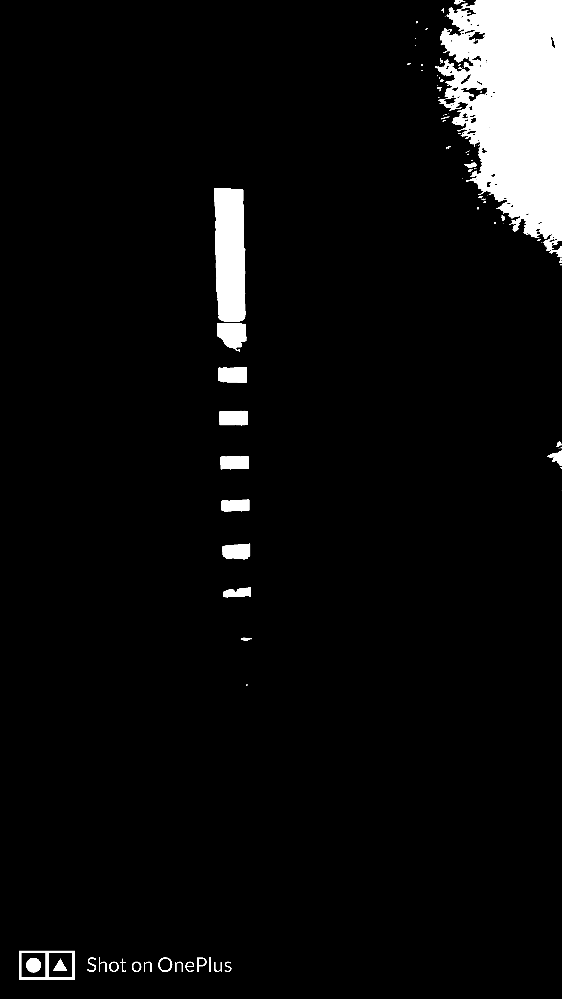

In [22]:
img = cv2.imread('/content/img1.jpg')
# remove noise from input image
dst = cv2.fastNlMeansDenoisingColored(img,None,10,10,7,21)
# convert BGR into gray image
gray=cv2.cvtColor(dst,cv2.COLOR_BGR2GRAY)
#  convert gray image into binary image by OTSU method
(_, im_bw) = cv2.threshold(gray, 190, 255, cv2.THRESH_BINARY)
cv2_imshow(im_bw)

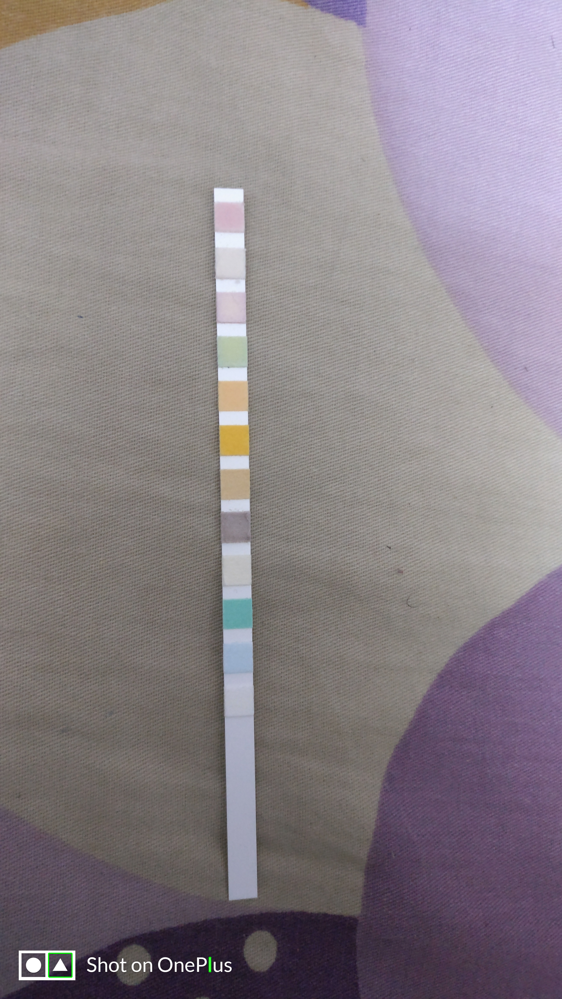

In [8]:
cnt, hierarchy = cv2.findContours(im_bw, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
# find the square bar box position
boxes=[]
for c in cnt:
    # area of each contour
    # remove small contours 
    are = cv2.contourArea(c)
    if (are < 100 ):
        continue
    # angle of each line in contour
    peri = cv2.arcLength(c, True)
    # remove contour which has many lines
    if(peri>5000):
        continue
    # check whtether contour is rectangle or not. If contour is not rectangle, we remove that contour
    approx = cv2.approxPolyDP(c, 0.01 * peri, True)
    if len(approx) !=4:
        continue
    # get the rectangle points of contour 
    rect = cv2.minAreaRect(c)
    # get box points from rectangle 
    box = cv2.boxPoints(rect)
    # convert float points into integer points
    box = np.int0(box)
    # add box points into variable boxes
    boxes.append(box)
    cv2.drawContours(img, [c], 0, (0, 255, 0), 3)
    if(len(boxes)==2):
        break
#Main strip contour
cv2_imshow(img)
#cv2.waitKey(0)

In [24]:
import cv2
import numpy as np
import matplotlib as plot
import pandas as pd
import copy
from copy import deepcopy
import os
import sys
from google.colab.patches import cv2_imshow

In [72]:


def get_objects(image,gb1,gb2,cn1,cn2,it) :


    # show_Image(image,"original_image")

    # Apply gaussian blur to the images
    blurred = cv2.GaussianBlur(image, (gb1,gb2), 0)

    # get the edges of the image    # show the edged image
    edged = cv2.Canny(blurred, cn1, cn2)

    #show_Image(edged, "Canny_image")

    # Get the area of the Image andd contour ratio
    Area = np.shape(image)[0] * np.shape(image)[1]
    lower_Ratio = 400

    # get the Kernel for closing the edges to get the contours
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel, iterations=it)
    #cv2_imshow(closed)
    
    try:
        (_, cnts, hie) = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    except ValueError:
        (cnts, hie) = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if hie is None:
        return [],0,0

    idx = 0
    cntsSorted = sorted(cnts, key=lambda contours: cv2.contourArea(contours))
    image_candidates = []
    stripidx=0
    color_checkeridx=0
    # loop through each of the contours greater than Area/lower_Ratio.. The first contour would be color_checker and the second one is strip
    for c in cntsSorted:
        if cv2.contourArea(c) > (Area / lower_Ratio):


            idx=idx+1
            x, y, w, h = cv2.boundingRect(c)
            if (h/w)>3 or (w/h)>3 :
                x, y, w, h = cv2.boundingRect(c)
                Strip = image[y:y + h, x:x + w]
                image_candidates.append(Strip)
                # cv2.imwrite("Strip.jpg", Strip)
                print('Strip', cv2.contourArea(c))
                stripidx = idx-1
                #print(image_candidates)

            else:
                rect = cv2.minAreaRect(c)
                color_checker = crop_minAreaRect(image, rect)
                image_candidates.append(color_checker)
                # print('this is shape',np.shape(color_checker)[0]*np.shape(color_checker)[1])
                print('colorcheckerarea',cv2.contourArea(c))
                #cv2.imwrite("colorchecker.jpg", color_checker)
                color_checkeridx=idx-1
                #cv2_imshow(color_checker)

    return image_candidates,stripidx,color_checkeridx                










def analyse_image(image_path) :

   # image_path="IMG-20180814-WA0002.jpg";
    if not os.path.exists(image_path) :
        print("Image path does not exist")
        return "{\"Error\":\"path_does_not_exist\"}"
    image = cv2.imread(image_path)
    if image is None :
        print("error")
        #return "{\"Error\":\"the file is not a image\"}"


    image_candidates,sidx,cidx=get_objects(image,13,13,15,20,20)
    
    
analyse_image('/content/img2.jpg')



Strip 1095762.5
